In [22]:
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import pandas as pd
import plotly.graph_objects as go

from sklearn.decomposition import PCA
from top2vec import Top2Vec

In [2]:
model = Top2Vec.load('results/models/content-model.bin')

# Analysis of topic numbers

In [3]:
model.get_num_topics()

73

In [4]:
model.hierarchical_topic_reduction(20)

[[22, 38, 42, 58, 1],
 [15, 25, 2],
 [43, 68, 41, 20, 24, 70, 5],
 [13, 66, 55, 64, 3],
 [54, 21, 39, 31, 44, 19],
 [29, 72, 33, 37, 63, 67, 12],
 [0],
 [4],
 [49, 9, 27, 10],
 [26, 45, 53, 35],
 [14],
 [40, 52, 16],
 [23, 17],
 [46, 8],
 [34, 69, 59, 56, 60, 62, 6],
 [30, 11],
 [7],
 [32, 36, 51, 71, 48],
 [47, 61, 18],
 [50, 57, 65, 28]]

In [10]:
model.topic_sizes_reduced

0     538
1     472
2     455
3     393
4     342
5     336
6     333
7     310
8     299
9     250
10    245
11    241
12    236
13    232
14    216
15    211
16    202
17    184
18    184
19    172
dtype: int64

# Generate plots for analysis

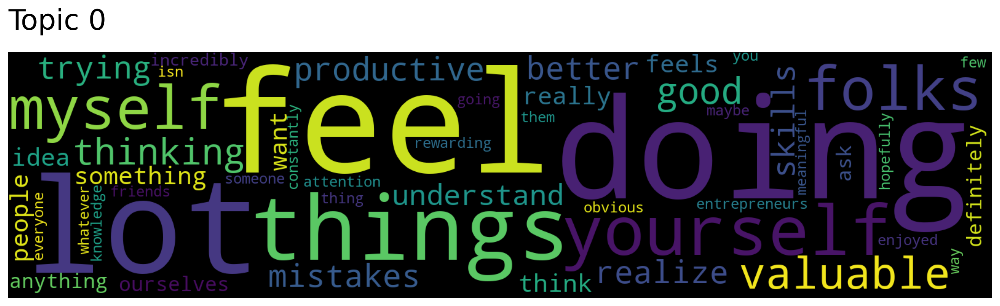

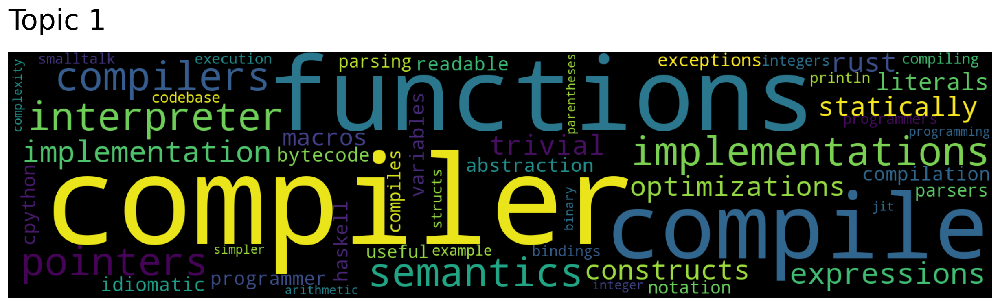

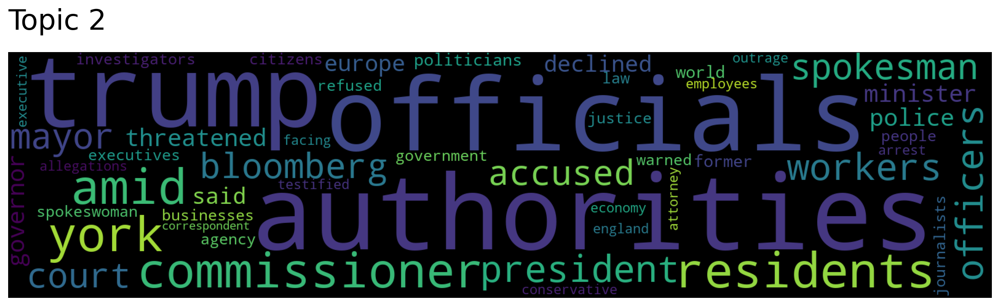

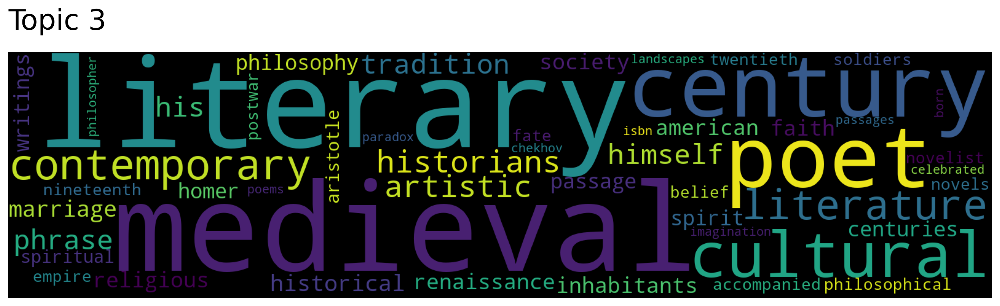

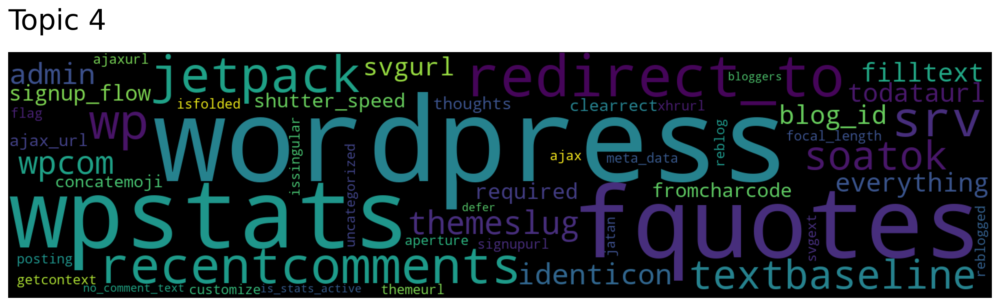

...

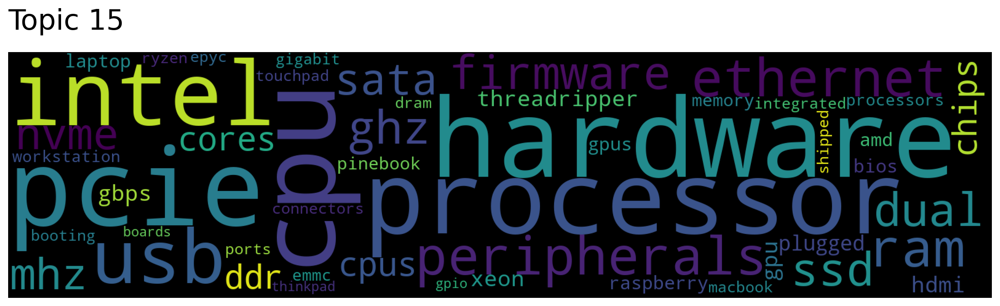

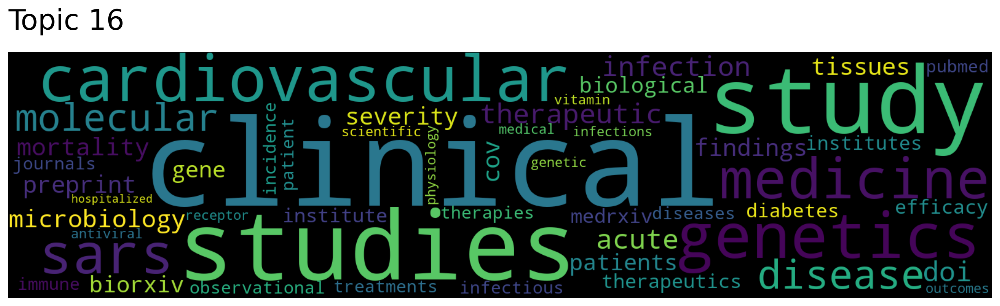

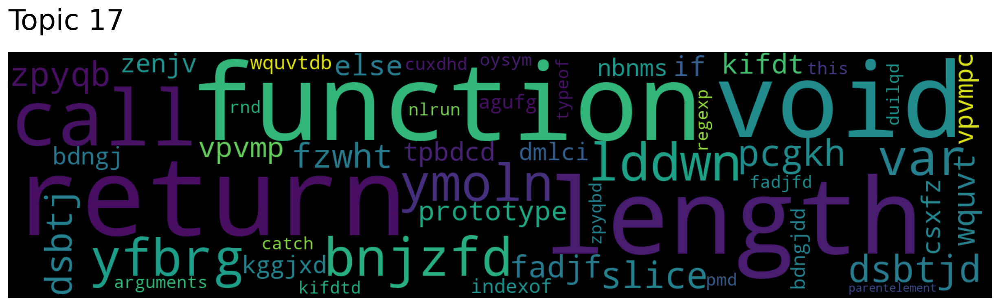

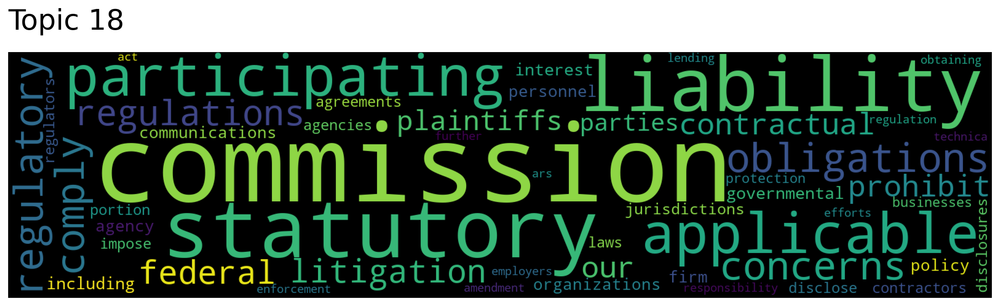

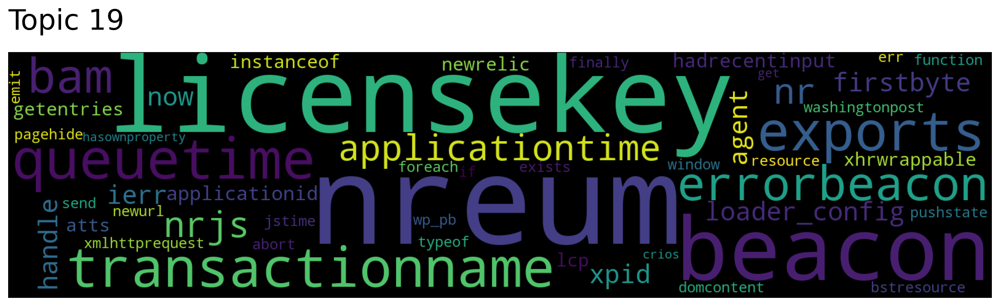

In [20]:
for i in range(model.get_num_topics(reduced=True)):
    _ = model.generate_topic_wordcloud(i, reduced=True)
    plt.savefig(f'results/plots-reduced/{i}.png', bbox_inches='tight')

In [7]:
topic_vectors_pca = PCA(n_components=2).fit_transform(model.topic_vectors_reduced)
topic_words, word_scores, topic_nums = model.get_topics(reduced=True)

In [8]:
customdata = ['<br>'.join(el[:10]) for el in topic_words]

hovertemplate_label = "<b>Topic: %{text}</b><br>"
hovertemplate_papers = 'Words:<br>%{customdata}'
hovertemplate_extra = "<extra></extra>"
hovertemplate = hovertemplate_label + hovertemplate_papers + hovertemplate_extra

data = go.Scatter(
    x = topic_vectors_pca[:, 0],
    y = topic_vectors_pca[:, 1],
    text = topic_nums,
    hovertemplate = hovertemplate,
    customdata = customdata,
    mode = 'markers',
    marker = {
        'size': 20
    }
)

fig = go.Figure(
    data = data,
    layout = go.Layout(
        title='Hacker News topics',
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        plot_bgcolor='rgba(0,0,0,0)',
        showlegend=False
    )
)

fig.write_html('results/hacker-news-topics.html')

# Merge articles with metadata

In [61]:
articles = pd.read_csv('../data/articles.csv')
content = pd.read_csv('../data/content-clean.csv')

In [62]:
topic_mapping = {
    0: 'People and ideas',
    1: 'Compilers',
    2: 'US Politics and administration',
    3: 'Literature, culture, philosophy',
    4: 'Wordpress',
    5: 'Weird letters',
    6: 'Github repositories',
    7: 'Deployments and databases',
    8: 'Linux',
    9: 'JavaScript',
    10: 'People words',
    11: 'Software',
    12: 'Renewable energy',
    13: 'Machine Learning',
    14: 'Weird words',
    15: 'Hardware',
    16: 'Medicine',
    17: 'Texts with codes',
    18: 'Government committees',
    19: 'Programming words'
}

In [63]:
content['topic'] = [topic_mapping[el] for el in model.doc_top_reduced]

In [64]:
articles_with_topics = pd.merge(articles, content, on = 'url', how = 'left')
articles_with_topics = articles_with_topics.dropna(subset = ['text'])
articles_with_topics = articles_with_topics.drop('text')

In [68]:
articles_with_topics.drop('text', axis = 'columns')

KeyError: "['text'] not found in axis"

In [66]:
articles_with_topics.to_csv('../data/articles-with-topics.csv', index=False)